# RNA–ATAC dynamics in human organoid development

This notebook shows how MOFI connects temporal programs, marker trends, trajectories, and growth across RNA and ATAC measurements in the human organoid example.

The analysis starts from the released fitted objects. This is the same point at which a user would begin after training a dynamics model and a cross-modality map on a new dataset.


## Workflow

1. Resolve the fitted RNA, ATAC, dynamics, and mapping objects.
2. Reconstruct dense-time programs and the differential-result panel.
3. Compare synchronized trajectories and NKX2-1 trends.
4. Plot modality-specific trajectories and growth.


In [ ]:
from pathlib import Path
import json

from mofi_notebook import setup_notebook, suppress_live_plot_output

# Run Jupyter from the repository root. The helper selects CUDA when available.
ROOT, DEVICE, _ = setup_notebook()
print(f"Repository: {ROOT}")
print(f"Device: {DEVICE}")


## 1. Load the released analysis objects


In [ ]:
from CytoBridge.reproducibility import require_paper_data

DATASET = "ho"
paths = require_paper_data(DATASET, ROOT)
paths


## 2. Reconstruct temporal programs

The downstream call generates the joint program panel and the molecule-level differential panel. Add or remove names in `selected_figures` when you want a different standard output.


In [ ]:
from CytoBridge.reproducibility import run_real_downstream

paper_output = ROOT / "results" / "figure_5_paper"
with suppress_live_plot_output():
    downstream = run_real_downstream(
        DATASET,
        output_dir=paper_output,
        selected_figures=["program_both", "key_molecule_volcano"],
        device=DEVICE,
        sample_max_cells=None,
        reuse_cache=True,
        repo_root=ROOT,
    )
run_dir = Path(downstream["run_dir"])
run_dir


### Temporal programs in both modalities


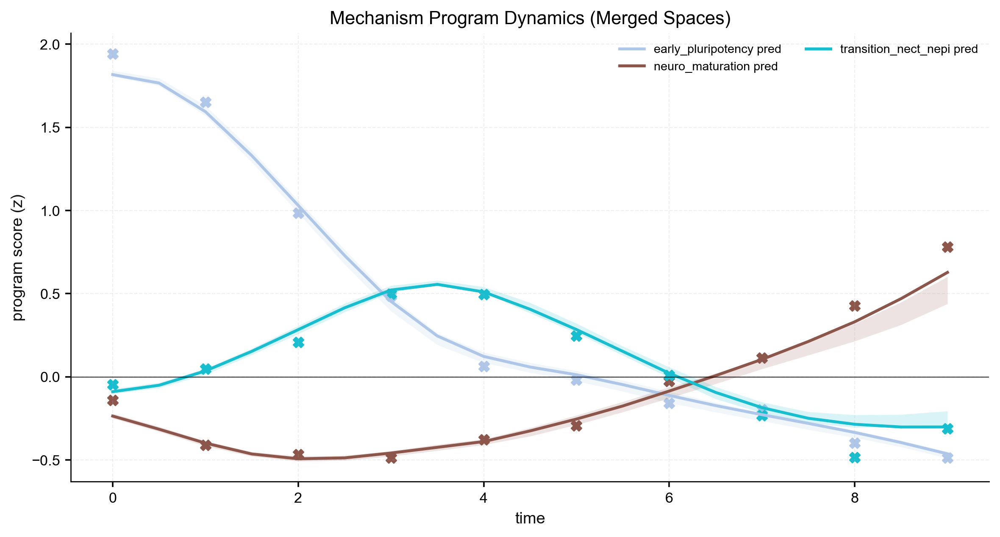

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(run_dir / "figures" / "program_dynamics_both.png")


### Differential support for key molecules

The volcano panel is a path-versus-background comparison. The corresponding CSV files are saved under the run's `tables/` directory and can be loaded for custom labelling or enrichment analysis.


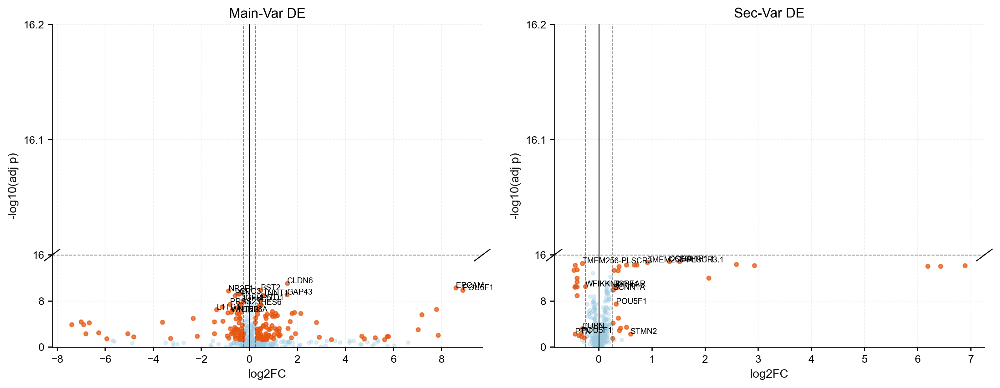

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(run_dir / "figures" / "key_molecule_volcano.png")


## 3. Compare synchronized RNA and ATAC trajectories

The corridor aligns the two modalities on a common time axis while preserving each modality's own embedding.


In [ ]:
from CytoBridge.manuscript import render_synchronized_corridor

corridor_dir = run_dir / "figures" / "synchronized_corridor"
with suppress_live_plot_output():
    render_synchronized_corridor(
        DATASET,
        output_dir=corridor_dir,
        device=DEVICE,
        direction="1to2",
        repo_root=ROOT,
    )
corridor_dir


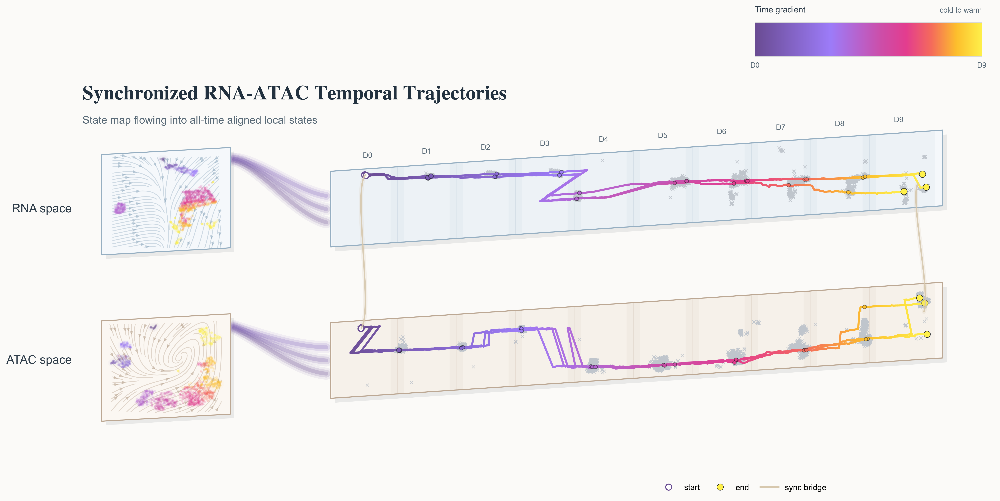

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(corridor_dir / "sync_multimodal_time_corridor.png")


## 4. Follow NKX2-1 in RNA and ATAC

The same marker is requested in both modalities. For another gene, edit only `markers_by_modality` and `output_names`.


In [ ]:
from CytoBridge.manuscript import plot_marker_bridging

with suppress_live_plot_output():
    marker_outputs = plot_marker_bridging(
        DATASET,
        run_dir=run_dir,
        output_dir=run_dir / "figures" / "nkx2_1",
        markers_by_modality={"main_var": ["NKX2-1"], "sec_var": ["NKX2-1"]},
        output_names={"main_var": "NKX2-1_RNA", "sec_var": "NKX2-1_ATAC"},
        config_output_dir=paper_output,
        device=DEVICE,
        repo_root=ROOT,
    )
marker_outputs


### NKX2-1 RNA trend


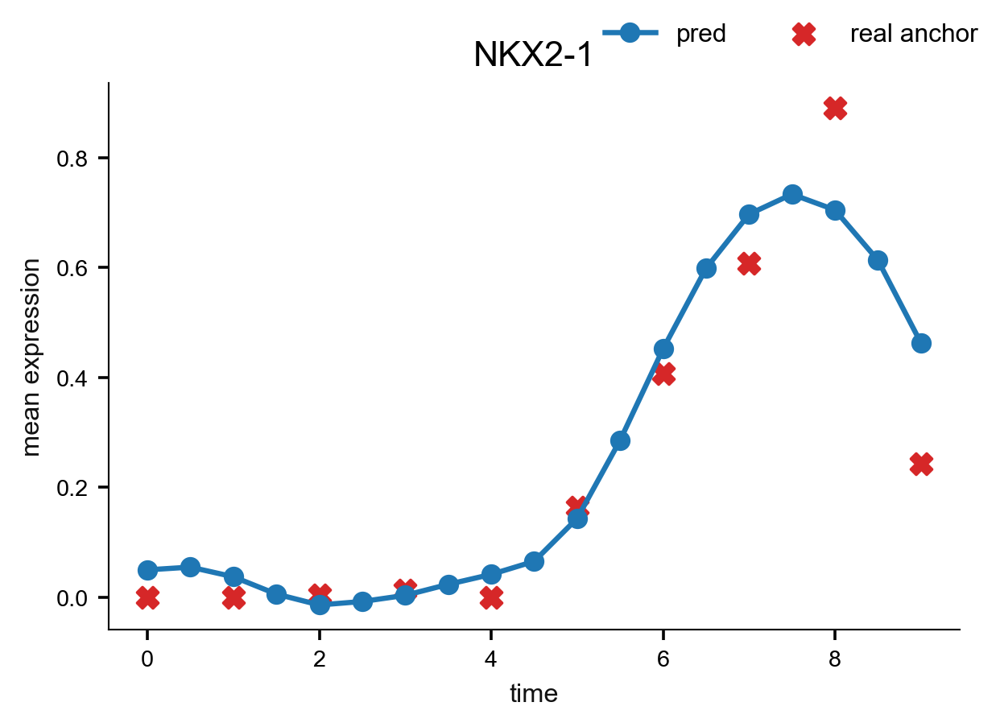

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(run_dir / "figures" / "nkx2_1" / "NKX2-1_RNA.png")


### NKX2-1 ATAC trend


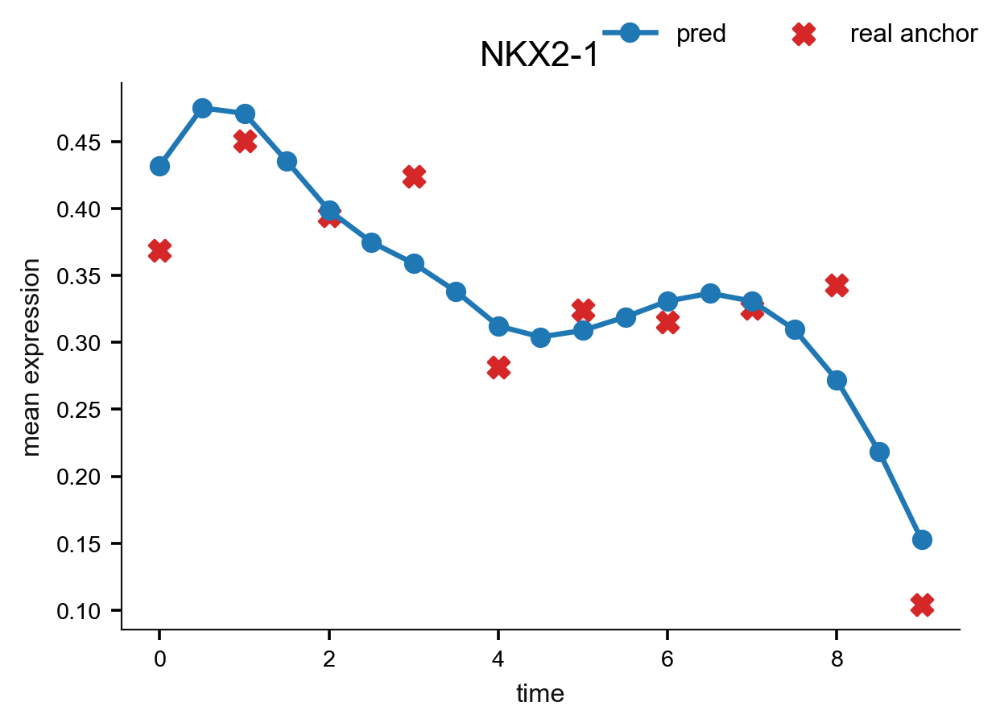

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(run_dir / "figures" / "nkx2_1" / "NKX2-1_ATAC.png")


## 5. Plot trajectories and growth

The helper returns four explicit output paths. The RNA trajectory uses the released paper coordinate system; ATAC and both growth panels are rendered through the current library.


In [ ]:
from CytoBridge.reproducibility import run_paper_ode_v3

with suppress_live_plot_output():
    ode_v3 = run_paper_ode_v3(
        DATASET,
        output_dir=run_dir / "figures" / "paper_ode_v3",
        device=DEVICE,
        repo_root=ROOT,
    )
ode_v3["outputs"]


### RNA trajectories


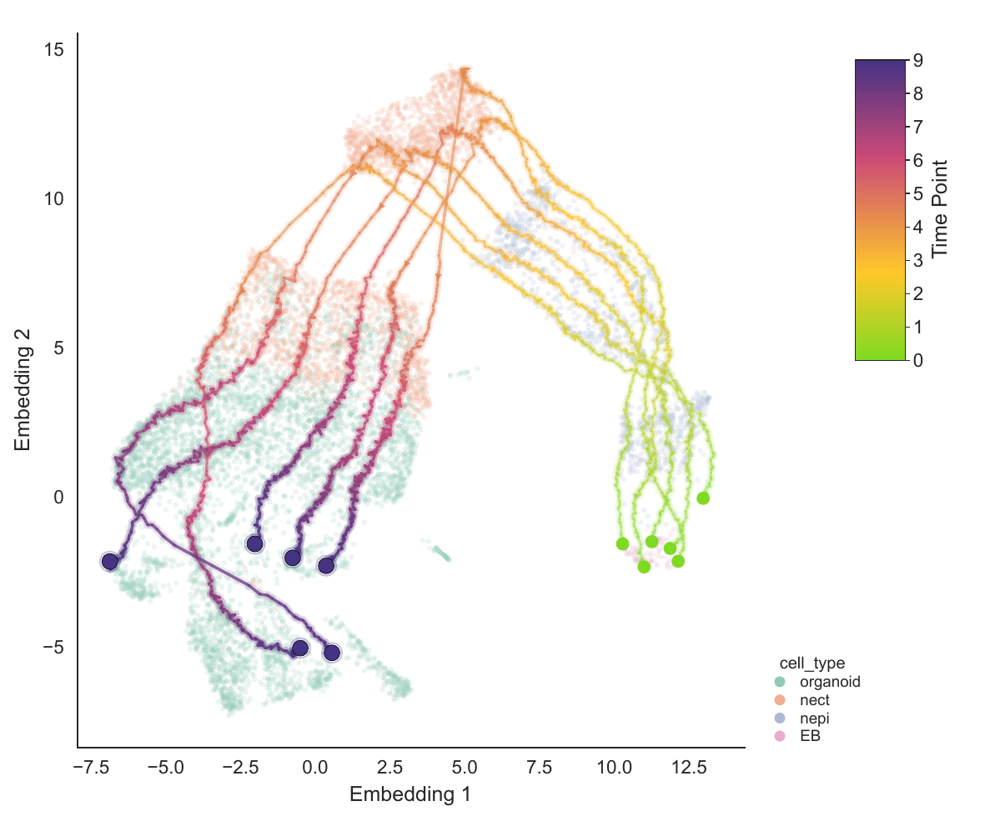

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(Path(ode_v3["outputs"]["primary_trajectory_png"]))


### ATAC trajectories


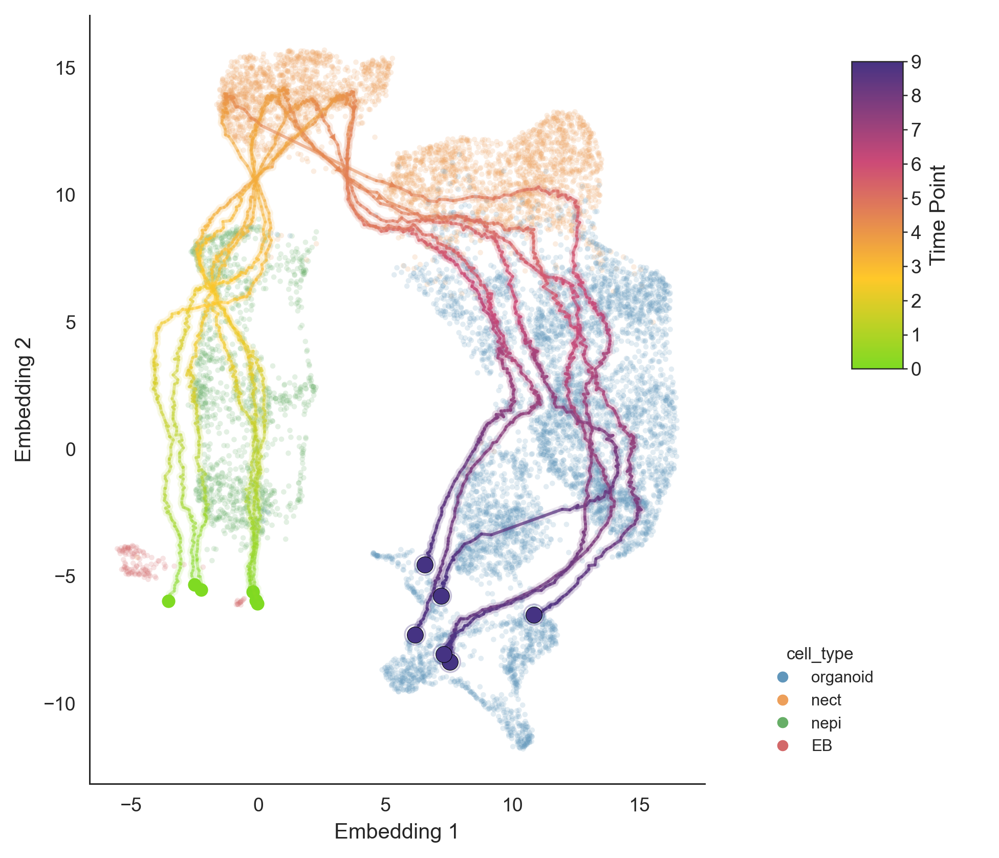

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(Path(ode_v3["outputs"]["secondary_trajectory_png"]))


### Growth in RNA space


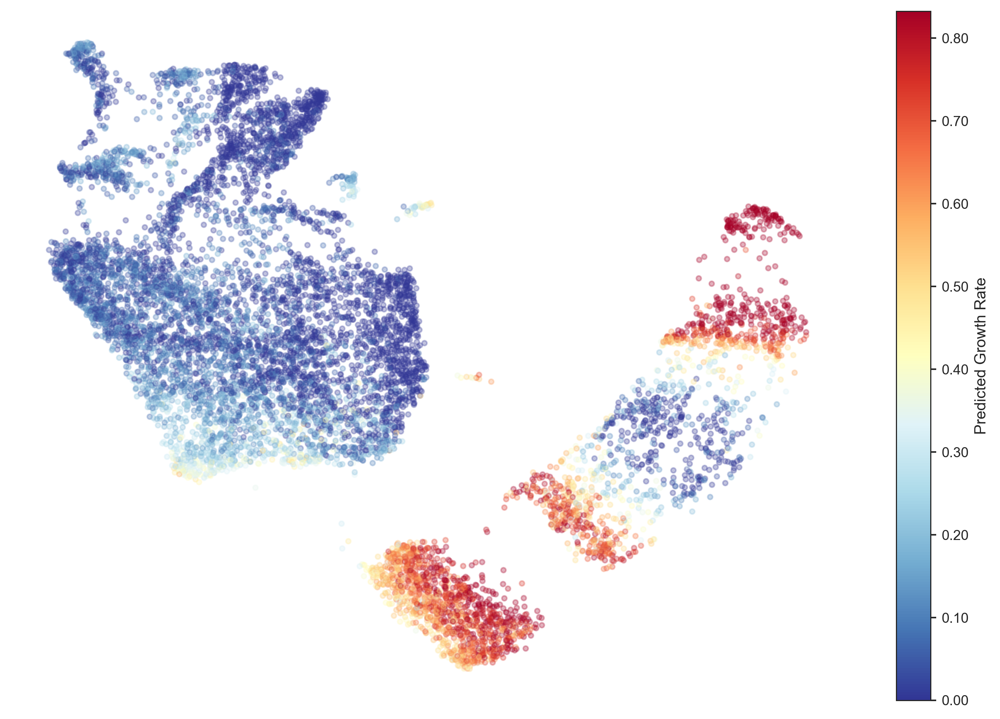

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(Path(ode_v3["outputs"]["primary_growth_png"]))


### Growth in ATAC space


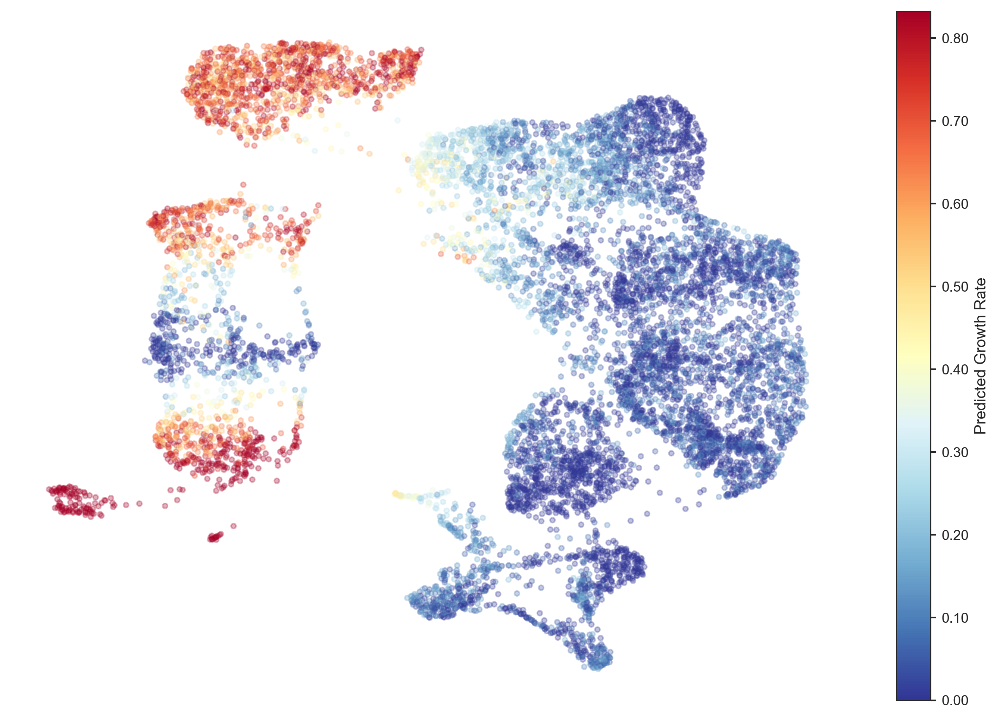

In [ ]:
from mofi_notebook import show_paper_panel
show_paper_panel(Path(ode_v3["outputs"]["secondary_growth_png"]))


## Apply the workflow to your own data

The figure-specific helpers above keep the paper example concise, but the reusable workflow is the same for another RNA–ATAC dataset:

1. Put time labels and cell-type labels in `adata.obs`.
2. Preprocess each modality with `CytoBridge.pp.preprocess`.
3. Train the dynamics model with `CytoBridge.tl.fit` and save the returned `AnnData` object.
4. Fit or load the cross-modality map.
5. Reuse the plotting calls shown above with your own paths, marker names, perturbation targets, and time points.

```python
import scanpy as sc
import CytoBridge as cb

adata = sc.read_h5ad("my_data.h5ad")
adata = cb.pp.preprocess(
    adata,
    time_key="time",
    dim_reduction="PCA",
    normalization=True,
    log1p=True,
    select_hvg=True,
)
adata = cb.tl.fit(adata, config="ruot", device=DEVICE)
adata.write_h5ad("my_data_with_mofi_model.h5ad")
```

Start by changing only the input paths and metadata keys. Once that run works, change biological choices such as markers, source populations, perturbation scores, or displayed cell types.
